In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn import tree


In [ ]:
lc_data =  pd.read_csv('https://raw.githubusercontent.com/cjflanagan/cs68/master/lending_club_training_data_subset.csv')

In [ ]:
lc_data.shape

(20000, 151)

In [ ]:
lc_data.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,...,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
0,65230,92451797,NaN,26450.0,26450.0,26450.0,60 months,18.99%,685.99,D,D3,Project Accountant,3 years,RENT,63000.0,Not Verified,Nov-2016,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,Debt consolidation,100xx,NY,1.75,2.0,Sep-2007,675.0,679.0,1.0,11.0,NaN,6.0,0.0,204.0,2.8%,14.0,w,0.0,...,0.0,18914.0,6155.0,7300.0,11614.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN
1,36521,94187830,NaN,12000.0,12000.0,12000.0,36 months,11.44%,395.37,B,B4,Sr Business Analyst,4 years,RENT,85000.0,Source Verified,Nov-2016,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,debt_consolidation,Debt consolidation,786xx,TX,11.48,0.0,Aug-2008,680.0,684.0,0.0,33.0,NaN,11.0,0.0,12855.0,59.2%,18.0,w,0.0,...,0.0,52683.0,38686.0,15000.0,30983.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN
2,25712,93882482,NaN,1000.0,1000.0,1000.0,36 months,15.99%,35.16,C,C5,Maintenance,3 years,RENT,90000.0,Source Verified,Dec-2016,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,other,Other,557xx,MN,10.76,0.0,Feb-1999,695.0,699.0,0.0,NaN,NaN,13.0,0.0,18157.0,99.2%,27.0,w,0.0,...,0.0,56789.0,62872.0,17800.0,38489.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN
3,92973,91238602,NaN,10000.0,10000.0,10000.0,36 months,10.99%,327.34,B,B4,NaN,NaN,RENT,40000.0,Verified,Oct-2016,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,credit_card,Credit card refinancing,224xx,VA,20.43,0.0,May-2005,680.0,684.0,0.0,51.0,NaN,10.0,0.0,6771.0,44%,32.0,f,0.0,...,0.0,42402.0,26059.0,7300.0,27002.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN
4,16335,94465406,NaN,4500.0,4500.0,4500.0,36 months,26.24%,181.89,E,E5,Forman,5 years,RENT,30000.0,Verified,Dec-2016,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,other,Other,322xx,FL,23.76,0.0,Feb-2012,660.0,664.0,1.0,28.0,78.0,7.0,1.0,2483.0,59.1%,7.0,f,0.0,...,0.0,54722.0,50339.0,300.0,50522.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
lc_data.describe()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,installment,annual_inc,desc,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,total_acc,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_amnt,next_pymnt_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,annual_inc_joint,dti_joint,acc_now_delinq,tot_coll_amt,...,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,deferral_term,hardship_amount,hardship_length,hardship_dpd,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,settlement_amount,settlement_percentage,settlement_term
count,20000.000000,2.000000e+04,0.0,20000.000000,20000.000000,20000.000000,20000.000000,2.000000e+04,0.0,19996.000000,20000.000000,20000.000000,20000.000000,20000.0000,10838.000000,4403.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.0,20000.0,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,0.0,20000.000000,20000.000000,20000.000000,6106.000000,20000.0,771.000000,771.000000,20000.000000,20000.000000,...,20000.000000,20000.00000,20000.000000,20000.000000,20000.000000,18761.000000,20000.000000,20000.000000,20000.000000,20000.000000,19749.000000,20000.000000,20000.000000,2.000000e+04,2.000000e+04,20000.000000,2.000000e+04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,415.000000,449.000000,415.000000,415.000000,315.000000,449.000000,449.000000,1921.000000,1921.000000,1921.000000
mean,51418.982150,9.290387e+07,NaN,14127.670000,14127.670000,14121.002500,442.782179,7.718502e+04,NaN,19.335560,0.370550,692.288500,696.288600,0.6217,33.568094,69.185555,11.787900,0.285050,15496.040500,23.857050,0.0,0.0,12142.995672,12137.243935,8913.566047,2462.015850,4.858860,762.554922,135.249319,3039.983913,NaN,633.717500,598.235500,0.023250,43.651818,1.0,110325.217730,18.597795,0.005950,275.326700,...,8.539900,8.26140,13.711000,5.673350,11.735200,0.001013,0.003700,0.102150,2.312700,93.251490,43.308724,0.163450,0.080050,1.685221e+05,5.152133e+04,21026.705250,4.502777e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.973494,199.822695,2.973494,14.619277,361.875651,9900.660200,347.578062,4778.109584,47.208069,15.322228
std,29890.449287,2.876083e+06,NaN,9105.170445,9105.170445,9102.035768,285.767742,5.840956e+04,NaN,16.144365,0.977134,29.738266,29.738782,0.9138,21.709430,24.926195,5.824921,0.661452,20549.979232,11.943569,0.0,0.0,9545.356471,9542.009088,8246.700422,2523.570091,21.091912,1695.235974,303.702337,5696.656748,NaN,89.087805,176.103995,0.166766,21.605577,0.0,49335.932524,6.985357,0.081332,2029.180851,...,7.508484,4.82103,8.059729,3.338474,5.803229,0.031808,0.063926,0.564209,1.995775,9.551769,36.335100,0.414056,0.445367,1.868642e+05,5.031752e+04,20799.278125,4.592168e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.160828,180.079598,0.160828,9.331502,372.422665,8201.740536,1078.155457,3710.487026,5.940950,7.030645
min,5.000000,1.023128e+06,NaN,1000.000000,1000.000000,950.000000,30.120000,0.000000e+00,NaN,0.000000,0.000000,660.000000,664.000000,0.0000,0.000000,1.000000,1.000000,0.000000,0.000000,2.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,499.000000,0.000000,0.00

In [ ]:
lc_data['loan_status'].value_counts(dropna=False)

Charged Off    10000
Fully Paid     10000
Name: loan_status, dtype: int64

In [ ]:
#checking missing in dataset

def missing_values_table(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        return mis_val_table_ren_columns

In [ ]:
'''
#simple way of finding the null values

# Find the count and percentage of missing values
df_na = pd.DataFrame({'Percent': 100*df.isnull().sum()/len(df), 'Count': df.isnull().sum()})

# Print columns with null count > 0
df_na[df_na['Count'] > 0]
'''

'''
#dropping columns based on threshold

# Create a new dataframe with 80% value retention
df = df.dropna(axis=1, thresh=int(0.75*len(df)))
df.head()

'''

'\n#dropping columns based on threshold\n\n# Create a new dataframe with 80% value retention\ndf = df.dropna(axis=1, thresh=int(0.75*len(df)))\ndf.head()\n\n'

In [ ]:
missing_values_table(lc_data)

Your selected dataframe has 151 columns.
There are 61 columns that have missing values.


,Missing Values,% of Total Values
member_id,20000,100.0
revol_bal_joint,20000,100.0
sec_app_mths_since_last_major_derog,20000,100.0
sec_app_collections_12_mths_ex_med,20000,100.0
sec_app_chargeoff_within_12_mths,20000,100.0
...,...,...
hardship_flag,34,0.2
revol_util,16,0.1
dti,4,0.0
all_util,1,0.0


In [ ]:
#dropping columns which has 100% missing values
lc_data_new=lc_data.drop(columns = ['member_id','revol_bal_joint','sec_app_mths_since_last_major_derog','sec_app_collections_12_mths_ex_med','sec_app_chargeoff_within_12_mths'])

#dropping columns between 75 to 90% null range

lc_data_new=lc_data_new.drop(columns = ['sec_app_earliest_cr_line',
                                    'next_pymnt_d',
                                    'sec_app_open_acc',
                                    'sec_app_mort_acc',
                                    'sec_app_inq_last_6mths',
                                    'sec_app_num_rev_accts',
                                    'sec_app_fico_range_high',
                                    'sec_app_fico_range_low',
                                    'sec_app_open_act_il',
                                    'sec_app_revol_util',
                                    'desc',
                                    'orig_projected_additional_accrued_interest',
                                    'hardship_type',
                                    'hardship_dpd',
                                    'deferral_term',
                                    'hardship_loan_status',
                                    'hardship_reason',
                                    'hardship_length',
                                    'hardship_end_date'
                                    ])

#lc_data_new=lc_data_new.drop(columns = ['member_id','revol_bal_joint','sec_app_mths_since_last_major_derog','sec_app_collections_12_mths_ex_med','sec_app_chargeoff_within_12_mths'])


lc_data_new=lc_data_new.drop(columns = ['hardship_start_date',
'payment_plan_start_date',
'hardship_status',
'hardship_amount',
'hardship_payoff_balance_amount',
'hardship_last_payment_amount',
'verification_status_joint',
'dti_joint',
'annual_inc_joint',
'debt_settlement_flag_date',
'settlement_term',
'settlement_status',
'settlement_date',
'settlement_amount',
'settlement_percentage',
'mths_since_last_record',
'mths_since_recent_bc_dlq']
)

missing_values_table(lc_data_new)

missing_values_table(lc_data_new)




Your selected dataframe has 110 columns.
There are 20 columns that have missing values.
Your selected dataframe has 110 columns.
There are 20 columns that have missing values.


,Missing Values,% of Total Values
mths_since_last_major_derog,13894,69.5
mths_since_recent_revol_delinq,12613,63.1
mths_since_last_delinq,9162,45.8
il_util,2371,11.9
mths_since_recent_inq,1992,10.0
emp_title,1562,7.8
emp_length,1536,7.7
num_tl_120dpd_2m,1239,6.2
mths_since_rcnt_il,532,2.7
mo_sin_old_il_acct,532,2.7


In [ ]:
missing=missing_values_table(lc_data_new)

Your selected dataframe has 110 columns.
There are 20 columns that have missing values.


In [ ]:
MISS_LIST=missing.index.tolist()
MISS_LIST


['mths_since_last_major_derog',
 'mths_since_recent_revol_delinq',
 'mths_since_last_delinq',
 'il_util',
 'mths_since_recent_inq',
 'emp_title',
 'emp_length',
 'num_tl_120dpd_2m',
 'mths_since_rcnt_il',
 'mo_sin_old_il_acct',
 'bc_util',
 'percent_bc_gt_75',
 'bc_open_to_buy',
 'mths_since_recent_bc',
 'last_pymnt_d',
 'hardship_flag',
 'revol_util',
 'dti',
 'title',
 'all_util']

In [ ]:
#checking data types of null columns before applying any further feature scaling

lc_data_new.dtypes[['mths_since_last_major_derog',
 'mths_since_recent_revol_delinq',
 'mths_since_last_delinq',
 'il_util',
 'mths_since_recent_inq',
 'emp_title',
 'emp_length',
 'num_tl_120dpd_2m',
 'mths_since_rcnt_il',
 'mo_sin_old_il_acct',
 'bc_util',
 'percent_bc_gt_75',
 'bc_open_to_buy',
 'mths_since_recent_bc',
 'last_pymnt_d',
 'hardship_flag',
 'revol_util',
 'dti',
 'title',
 'all_util']]


 #OBJECT COLUMNS:
 #emp_title
 #emp_length
 #last_pymnt_d
 #hardship_flag
 #revol_util
 #title



 

mths_since_last_major_derog       float64
mths_since_recent_revol_delinq    float64
mths_since_last_delinq            float64
il_util                           float64
mths_since_recent_inq             float64
emp_title                          object
emp_length                         object
num_tl_120dpd_2m                  float64
mths_since_rcnt_il                float64
mo_sin_old_il_acct                float64
bc_util                           float64
percent_bc_gt_75                  float64
bc_open_to_buy                    float64
mths_since_recent_bc              float64
last_pymnt_d                       object
hardship_flag                      object
revol_util                         object
dti                               float64
title                              object
all_util                          float64
dtype: object

In [ ]:
'''
#Null value handling for object data types
lc_data_new['emp_title'] = lc_data_new['emp_title'].fillna("Missing")
lc_data_new['emp_length'] = lc_data_new['emp_length'].fillna("Missing")
lc_data_new['last_pymnt_d'] = lc_data_new['last_pymnt_d'].fillna("Missing")
lc_data_new['hardship_flag'] = lc_data_new['hardship_flag'].fillna("Missing")
lc_data_new['revol_util'] = lc_data_new['revol_util'].fillna("Missing")
lc_data_new['title'] = lc_data_new['title'].fillna("Missing")

'''
'''
emp_title
 emp_length
 last_pymnt_d
 hardship_flag
 revol_util
 title
 '''


 #Another way of filling the missing catgorical variables

# One approach to imputing categorical features is to replace missing values with the most common class. 
#You can do with by taking the index of the most common feature given in Pandas’ value_counts function.


# for each column, get value counts in decreasing order and take the index (value) of most common class
#df_most_common_imputed = colors.apply(lambda x: x.fillna(x.value_counts().index[0]))
#df_most_common_imputed

'\nemp_title\n emp_length\n last_pymnt_d\n hardship_flag\n revol_util\n title\n '

In [ ]:
'''
mths_since_last_major_derog
 mths_since_recent_revol_delinq
 mths_since_last_delinq
 il_util
 mths_since_recent_inq
 num_tl_120dpd_2m
 mths_since_rcnt_il
 mo_sin_old_il_acct
 bc_util
 percent_bc_gt_75
 bc_open_to_buy
 mths_since_recent_bc
 dti
 all_util
 '''

 #nULL VALUE HANDLING FOR FLOAT OR INTEGER DATA TYPES (REPLACING NULL WITH MEAN OF THAT COLUMN)
'''
lc_data_new['mths_since_last_major_derog'].fillna((lc_data_new['mths_since_last_major_derog'].mean()), inplace=True)
lc_data_new['mths_since_recent_revol_delinq'].fillna((lc_data_new['mths_since_recent_revol_delinq'].mean()), inplace=True)
lc_data_new['mths_since_last_delinq'].fillna((lc_data_new['mths_since_last_delinq'].mean()), inplace=True)
lc_data_new['il_util'].fillna((lc_data_new['il_util'].mean()), inplace=True)
lc_data_new['mths_since_recent_inq'].fillna((lc_data_new['mths_since_recent_inq'].mean()), inplace=True)
lc_data_new['num_tl_120dpd_2m'].fillna((lc_data_new['num_tl_120dpd_2m'].mean()), inplace=True)
lc_data_new['mths_since_rcnt_il'].fillna((lc_data_new['mths_since_rcnt_il'].mean()), inplace=True)
lc_data_new['mo_sin_old_il_acct'].fillna((lc_data_new['mo_sin_old_il_acct'].mean()), inplace=True)
lc_data_new['bc_util'].fillna((lc_data_new['bc_util'].mean()), inplace=True)
lc_data_new['percent_bc_gt_75'].fillna((lc_data_new['percent_bc_gt_75'].mean()), inplace=True)
lc_data_new['bc_open_to_buy'].fillna((lc_data_new['bc_open_to_buy'].mean()), inplace=True)
lc_data_new['mths_since_recent_bc'].fillna((lc_data_new['mths_since_recent_bc'].mean()), inplace=True)
lc_data_new['dti'].fillna((lc_data_new['dti'].mean()), inplace=True)
lc_data_new['all_util'].fillna((lc_data_new['all_util'].mean()), inplace=True)
'''

"\nlc_data_new['mths_since_last_major_derog'].fillna((lc_data_new['mths_since_last_major_derog'].mean()), inplace=True)\nlc_data_new['mths_since_recent_revol_delinq'].fillna((lc_data_new['mths_since_recent_revol_delinq'].mean()), inplace=True)\nlc_data_new['mths_since_last_delinq'].fillna((lc_data_new['mths_since_last_delinq'].mean()), inplace=True)\nlc_data_new['il_util'].fillna((lc_data_new['il_util'].mean()), inplace=True)\nlc_data_new['mths_since_recent_inq'].fillna((lc_data_new['mths_since_recent_inq'].mean()), inplace=True)\nlc_data_new['num_tl_120dpd_2m'].fillna((lc_data_new['num_tl_120dpd_2m'].mean()), inplace=True)\nlc_data_new['mths_since_rcnt_il'].fillna((lc_data_new['mths_since_rcnt_il'].mean()), inplace=True)\nlc_data_new['mo_sin_old_il_acct'].fillna((lc_data_new['mo_sin_old_il_acct'].mean()), inplace=True)\nlc_data_new['bc_util'].fillna((lc_data_new['bc_util'].mean()), inplace=True)\nlc_data_new['percent_bc_gt_75'].fillna((lc_data_new['percent_bc_gt_75'].mean()), inplace=

In [ ]:
keep_list = ['addr_state', 'annual_inc', 'application_type', 'dti', 'earliest_cr_line', 'emp_length', 'emp_title', 'fico_range_high', 'fico_range_low', 'grade', 'home_ownership', 'id', 'initial_list_status', 'installment', 'int_rate', 'issue_d', 'loan_amnt', 'loan_status', 'mort_acc', 'open_acc', 'pub_rec', 'pub_rec_bankruptcies', 'purpose', 'revol_bal', 'revol_util', 'sub_grade', 'term', 'title', 'total_acc', 'verification_status', 'zip_code']

In [ ]:
len(keep_list)

31

In [ ]:
drop_list = [col for col in lc_data_new.columns if col not in keep_list]
print(drop_list)

['Unnamed: 0', 'funded_amnt', 'funded_amnt_inv', 'pymnt_plan', 'url', 'delinq_2yrs', 'inq_last_6mths', 'mths_since_last_delinq', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'last_credit_pull_d', 'last_fico_range_high', 'last_fico_range_low', 'collections_12_mths_ex_med', 'mths_since_last_major_derog', 'policy_code', 'acc_now_delinq', 'tot_coll_amt', 'tot_cur_bal', 'open_acc_6m', 'open_act_il', 'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc', 'all_util', 'total_rev_hi_lim', 'inq_fi', 'total_cu_tl', 'inq_last_12m', 'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy', 'bc_util', 'chargeoff_within_12_mths', 'delinq_amnt', 'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mths_since_recent_bc', 'mths_since_recent_inq', 'mth

In [ ]:
len(drop_list)

79

In [ ]:
lc_data_new.drop(labels=drop_list, axis=1, inplace=True)


In [ ]:
lc_data_new.shape


(20000, 31)

In [ ]:
#DROPPING id AND Unnamed: 0 COLUMN

lc_data_new=lc_data_new.drop(columns = ['id'])

Feature analysis


In [ ]:
#term

lc_data_new['term'].value_counts(dropna=False)



 36 months    15437
 60 months     4563
Name: term, dtype: int64

In [ ]:
lc_data_new['term'] = lc_data_new['term'].apply(lambda s: np.int8(s.split()[0]))


In [ ]:
lc_data_new['term'].value_counts(normalize=True)


36    0.77185
60    0.22815
Name: term, dtype: float64

In [ ]:
#grade, sub_grade

print(sorted(lc_data_new['grade'].unique()))


['A', 'B', 'C', 'D', 'E', 'F', 'G']


In [ ]:
print(sorted(lc_data_new['sub_grade'].unique()))

#The grade is implied by the subgrade, so let's drop the grade column.


['A1', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1', 'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3', 'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5']


In [ ]:
lc_data_new.drop('grade', axis=1, inplace=True)


In [ ]:
lc_data_new['emp_title'].describe()


count       18438
unique       9818
top       Manager
freq          360
Name: emp_title, dtype: object

In [ ]:
#here are too many different job titles for this feature to be useful, so we drop it.
lc_data_new.drop(labels='emp_title', axis=1, inplace=True)


In [ ]:
#emp_length

lc_data_new['emp_length'].value_counts(dropna=False).sort_index()


1 year       1331
10+ years    6633
2 years      1910
3 years      1623
4 years      1199
5 years      1241
6 years       933
7 years       641
8 years       761
9 years       743
< 1 year     1449
NaN          1536
Name: emp_length, dtype: int64

In [ ]:
lc_data_new['emp_length'].replace(to_replace='10+ years', value='10 years', inplace=True)


In [ ]:
lc_data_new['emp_length'].replace('< 1 year', '0 years', inplace=True)


In [ ]:
def emp_length_to_int(s):
    if pd.isnull(s):
        return s
    else:
        return np.int8(s.split()[0])


In [ ]:
lc_data_new['emp_length'] = lc_data_new['emp_length'].apply(emp_length_to_int)


In [ ]:
lc_data_new['emp_length'].value_counts(dropna=False).sort_index()


0.0     1449
1.0     1331
2.0     1910
3.0     1623
4.0     1199
5.0     1241
6.0      933
7.0      641
8.0      761
9.0      743
10.0    6633
NaN     1536
Name: emp_length, dtype: int64

In [ ]:
#home_ownership

lc_data_new['home_ownership'].value_counts(dropna=False)


MORTGAGE    9167
RENT        8367
OWN         2444
ANY           22
Name: home_ownership, dtype: int64

In [ ]:
lc_data_new['home_ownership'].replace(['ANY'], 'OTHER', inplace=True)


In [ ]:
lc_data_new['home_ownership'].value_counts(dropna=False)


MORTGAGE    9167
RENT        8367
OWN         2444
OTHER         22
Name: home_ownership, dtype: int64

In [ ]:
lc_data_new.groupby('home_ownership')['loan_status'].value_counts(normalize=True).loc[:,'Charged Off']


home_ownership
MORTGAGE    0.461547
OTHER       0.454545
OWN         0.499591
RENT        0.542369
Name: loan_status, dtype: float64

In [ ]:
#annual_inc

lc_data_new['annual_inc'].describe()


count    2.000000e+04
mean     7.718502e+04
std      5.840956e+04
min      0.000000e+00
25%      4.560000e+04
50%      6.500000e+04
75%      9.200000e+04
max      3.000000e+06
Name: annual_inc, dtype: float64

In [ ]:
#Annual income ranges from \$0 to \$3,00,000, with a median of \$75,000. Because of the large range of incomes, 
#we should take a log transform of the annual income variable.

In [ ]:
lc_data_new['log_annual_inc'] = lc_data_new['annual_inc'].apply(lambda x: np.log10(x+1))


In [ ]:
lc_data_new.drop('annual_inc', axis=1, inplace=True)


In [ ]:
lc_data_new['log_annual_inc'].describe()


count    20000.000000
mean         4.816489
std          0.248991
min          0.000000
25%          4.658974
50%          4.812920
75%          4.963793
max          6.477121
Name: log_annual_inc, dtype: float64

In [ ]:
#purpose

lc_data_new['purpose'].value_counts()


debt_consolidation    11774
credit_card            3789
other                  1411
home_improvement       1337
major_purchase          452
medical                 294
small_business          266
car                     201
vacation                188
moving                  165
house                   103
renewable_energy         20
Name: purpose, dtype: int64

In [ ]:
#Calculate the charge-off rates by purpose:

lc_data_new.groupby('purpose')['loan_status'].value_counts(normalize=True).loc[:,'Charged Off'].sort_values()


purpose
renewable_energy      0.300000
car                   0.348259
medical               0.435374
home_improvement      0.437547
vacation              0.462766
credit_card           0.464239
other                 0.474132
major_purchase        0.497788
moving                0.503030
debt_consolidation    0.523781
house                 0.592233
small_business        0.601504
Name: loan_status, dtype: float64

In [ ]:
#title

lc_data_new['title'].describe()


count                  19999
unique                    12
top       Debt consolidation
freq                   11776
Name: title, dtype: object

In [ ]:
#zip_code, addr_state

lc_data_new['zip_code'].sample(5)

18121    206xx
8014     462xx
1918     443xx
19914    331xx
15587    531xx
Name: zip_code, dtype: object

In [ ]:
lc_data_new['zip_code'].nunique()


823

In [ ]:
lc_data_new['addr_state'].sample(5)


18297    CA
5836     AL
13510    MI
3449     OK
3889     NY
Name: addr_state, dtype: object

In [ ]:
lc_data_new['addr_state'].nunique()


49

In [ ]:
#There are a lot of different zip codes, so let's just keep the state column.

lc_data_new.drop(labels='zip_code', axis=1, inplace=True)


In [ ]:
#Calculate the charge-off rates by address state:

lc_data_new.groupby('addr_state')['loan_status'].value_counts(normalize=True).loc[:,'Charged Off'].sort_values()


addr_state
VT    0.305556
DC    0.365854
ID    0.380952
RI    0.388235
CO    0.399478
DE    0.408163
OR    0.410811
SC    0.421525
MT    0.423729
HI    0.424242
ND    0.428571
ME    0.440000
CT    0.446494
KS    0.446541
NM    0.462810
MA    0.464455
OH    0.467492
NH    0.469880
UT    0.475806
MI    0.476190
MO    0.477745
NE    0.481132
AK    0.483871
WY    0.487805
AZ    0.487805
IL    0.489060
CA    0.491488
WA    0.492997
KY    0.495798
MD    0.497917
WI    0.500000
AL    0.501792
TX    0.507139
TN    0.507692
NY    0.518043
VA    0.518447
NC    0.521661
MN    0.522911
OK    0.523810
PA    0.524823
IN    0.530997
NJ    0.531250
FL    0.534069
LA    0.535865
GA    0.537867
NV    0.547771
MS    0.558140
AR    0.604938
SD    0.621622
Name: loan_status, dtype: float64

In [ ]:
#earliest_cr_line

lc_data_new['earliest_cr_line'].sample(5)


9114     Dec-1989
3883     Nov-2004
14835    Apr-2003
4318     Apr-2001
1369     Jun-1992
Name: earliest_cr_line, dtype: object

In [ ]:
lc_data_new['earliest_cr_line'].isnull().any()


False

In [ ]:
#Let's just retain the year for simplicity:

lc_data_new['earliest_cr_line'] = lc_data_new['earliest_cr_line'].apply(lambda s: int(s[-4:]))


In [ ]:
lc_data_new['earliest_cr_line'].describe()


count    20000.000000
mean      1999.975900
std          7.774725
min       1951.000000
25%       1996.000000
50%       2002.000000
75%       2005.000000
max       2013.000000
Name: earliest_cr_line, dtype: float64

In [ ]:
#fico_range_low, fico_range_high
lc_data_new[['fico_range_low', 'fico_range_high']].describe()


,fico_range_low,fico_range_high
count,20000.000000,20000.000000
mean,692.288500,696.288600
std,29.738266,29.738782
min,660.000000,664.000000
25%,670.000000,674.000000
50%,685.000000,689.000000
75%,705.000000,709.000000
max,845.000000,850.000000


In [ ]:
lc_data_new[['fico_range_low','fico_range_high']].corr()


,fico_range_low,fico_range_high
fico_range_low,1.0,1.0
fico_range_high,1.0,1.0


In [ ]:
#We only need to keep one of the FICO scores. We'll take the average of the two and call it fico_score:

lc_data_new['fico_score'] = 0.5*lc_data_new['fico_range_low'] + 0.5*lc_data_new['fico_range_high']


In [ ]:
lc_data_new.drop(['fico_range_high', 'fico_range_low'], axis=1, inplace=True)


In [ ]:
#revol_bal

lc_data_new['revol_bal'].describe()


count     20000.000000
mean      15496.040500
std       20549.979232
min           0.000000
25%        5824.750000
50%       10661.500000
75%       18471.500000
max      645772.000000
Name: revol_bal, dtype: float64

In [ ]:
lc_data_new['log_revol_bal'] = lc_data_new['revol_bal'].apply(lambda x: np.log10(x+1))


In [ ]:
lc_data_new.drop('revol_bal', axis=1, inplace=True)


In [ ]:
#application_type

lc_data_new['application_type'].value_counts()


Individual    19229
Joint App       771
Name: application_type, dtype: int64

In [ ]:
#Convert loan status to 0/1 charge-off indicator

lc_data_new.loan_status = lc_data_new.loan_status.replace({'Charged Off':1, 'Fully Paid':0})

In [ ]:
lc_data_new.shape


(20000, 26)

In [ ]:
#If any categorical variables have missing values, we'll need to create NaN dummy variables for those. So first check which variables have missing data:

missing_fractions = lc_data_new.isnull().mean().sort_values(ascending=False) # Fraction of data missing for each variable


In [ ]:
print(missing_fractions[missing_fractions > 0]) # Print variables that are missing data


emp_length    0.07680
revol_util    0.00080
dti           0.00020
title         0.00005
dtype: float64


In [ ]:
#AS WE CAN SEE TITLE HAS SOME MISSING VALUE, WE NEED TO FILL WITH SOME PLACE HOLDER VALUE


lc_data_new['title'] = lc_data_new['title'].fillna("Missing")


In [ ]:
#CHECKING AGAIN

missing_fractions = lc_data_new.isnull().mean().sort_values(ascending=False) # Fraction of data missing for each variable


In [ ]:
#
print(missing_fractions[missing_fractions > 0]) # Print variables that are missing data


emp_length    0.0768
revol_util    0.0008
dti           0.0002
dtype: float64


In [ ]:
categorical_cols = lc_data_new.columns[lc_data_new.dtypes=='object'].tolist()
categorical_cols

['int_rate',
 'sub_grade',
 'home_ownership',
 'verification_status',
 'issue_d',
 'purpose',
 'title',
 'addr_state',
 'revol_util',
 'initial_list_status',
 'application_type']

In [ ]:
#applying dummy variable

#as issue_d is a date column, excluding that into categorical columns


lc_data_new = pd.get_dummies(lc_data_new, columns=['sub_grade', 'home_ownership', 'verification_status', 'purpose', 'addr_state', 'initial_list_status', 'application_type'], drop_first=True)

In [ ]:
lc_data_new.shape


(20000, 119)

In [ ]:
lc_data_new.sample(5)

,loan_amnt,term,int_rate,installment,emp_length,issue_d,loan_status,title,dti,earliest_cr_line,open_acc,pub_rec,revol_util,total_acc,mort_acc,pub_rec_bankruptcies,log_annual_inc,fico_score,log_revol_bal,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,...,addr_state_HI,addr_state_ID,addr_state_IL,addr_state_IN,addr_state_KS,addr_state_KY,addr_state_LA,addr_state_MA,addr_state_MD,addr_state_ME,addr_state_MI,addr_state_MN,addr_state_MO,addr_state_MS,addr_state_MT,addr_state_NC,addr_state_ND,addr_state_NE,addr_state_NH,addr_state_NJ,addr_state_NM,addr_state_NV,addr_state_NY,addr_state_OH,addr_state_OK,addr_state_OR,addr_state_PA,addr_state_RI,addr_state_SC,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WY,initial_list_status_w,application_type_Joint App
11834,10550.0,36,21.49%,400.14,2.0,Nov-2016,1,Debt consolidation,17.05,1999,15.0,0.0,45%,23.0,0.0,0.0,4.480021,707.0,4.250956,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
12336,9850.0,36,8.99%,313.19,10.0,Oct-2016,0,Credit card refinancing,17.54,1991,9.0,0.0,31.4%,31.0,3.0,0.0,4.812920,677.0,3.816573,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
12051,3000.0,36,11.44%,98.85,3.0,Nov-2016,1,Debt consolidation,23.64,2008,15.0,0.0,44.4%,50.0,0.0,0.0,4.633479,697.0,4.385481,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
16245,25000.0,36,16.99%,891.20,6.0,Dec-2016,1,Debt consolidation,24.90,1995,9.0,0.0,69.9%,35.0,0.0,0.0,4.778158,677.0,4.186928,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4869,5000.0,36,13.99%,170.87,10.0,Oct-2016,0,Debt consolidation,23.89,2003,9.0,0.0,98.4%,21.0,1.0,0.0,4.812920,662.0,4.185995,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
#dropping title to reduce complexity of features
lc_data_new.drop('title', axis=1, inplace=True)

In [ ]:
lc_data_new['issue_d'].sample(5)

1460     Dec-2016
2803     Nov-2016
1912     Oct-2016
5457     Oct-2016
12582    Oct-2016
Name: issue_d, dtype: object

In [ ]:
lc_data_new['issue_d'].isnull().any()

False

In [ ]:
#No. Let's convert the issue dates to datetime objects:

lc_data_new['issue_d'] = pd.to_datetime(lc_data_new['issue_d'])


In [ ]:
lc_data_new['issue_d'].sample(5)


16617   2016-11-01
15969   2016-10-01
12620   2016-10-01
14178   2016-12-01
16570   2016-12-01
Name: issue_d, dtype: datetime64[ns]

In [ ]:
#ideally date columns does not add value to predictions so dropping the date columns

lc_data_new.drop('issue_d', axis=1, inplace=True)


In [ ]:
#splitting data into X and Y
lc_data_new.columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'emp_length',
       'loan_status', 'dti', 'earliest_cr_line', 'open_acc', 'pub_rec',
       ...
       'addr_state_TN', 'addr_state_TX', 'addr_state_UT', 'addr_state_VA',
       'addr_state_VT', 'addr_state_WA', 'addr_state_WI', 'addr_state_WY',
       'initial_list_status_w', 'application_type_Joint App'],
      dtype='object', length=117)

In [ ]:
Y=lc_data_new['loan_status']
X = lc_data_new.drop('loan_status', axis=1)

In [ ]:
Y.head(3)

0    1
1    0
2    0
Name: loan_status, dtype: int64

In [ ]:
X.head(6)

,loan_amnt,term,int_rate,installment,emp_length,dti,earliest_cr_line,open_acc,pub_rec,revol_util,total_acc,mort_acc,pub_rec_bankruptcies,log_annual_inc,fico_score,log_revol_bal,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,sub_grade_E3,sub_grade_E4,sub_grade_E5,...,addr_state_HI,addr_state_ID,addr_state_IL,addr_state_IN,addr_state_KS,addr_state_KY,addr_state_LA,addr_state_MA,addr_state_MD,addr_state_ME,addr_state_MI,addr_state_MN,addr_state_MO,addr_state_MS,addr_state_MT,addr_state_NC,addr_state_ND,addr_state_NE,addr_state_NH,addr_state_NJ,addr_state_NM,addr_state_NV,addr_state_NY,addr_state_OH,addr_state_OK,addr_state_OR,addr_state_PA,addr_state_RI,addr_state_SC,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WY,initial_list_status_w,application_type_Joint App
0,26450.0,60,18.99%,685.99,3.0,1.75,2007,6.0,0.0,2.8%,14.0,0.0,0.0,4.799347,677.0,2.311754,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,12000.0,36,11.44%,395.37,4.0,11.48,2008,11.0,0.0,59.2%,18.0,0.0,0.0,4.929424,682.0,4.109106,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
2,1000.0,36,15.99%,35.16,3.0,10.76,1999,13.0,0.0,99.2%,27.0,0.0,0.0,4.954247,697.0,4.259068,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,10000.0,36,10.99%,327.34,NaN,20.43,2005,10.0,0.0,44%,32.0,2.0,0.0,4.602071,682.0,3.830717,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,4500.0,36,26.24%,181.89,5.0,23.76,2012,7.0,1.0,59.1%,7.0,0.0,0.0,4.477136,662.0,3.395152,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,14000.0,36,8.24%,440.27,10.0,23.21,2005,16.0,0.0,53.8%,44.0,1.0,0.0,4.929424,707.0,4.399553,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
#X['int_rate'] = X['int_rate'].astype(str)

X['int_rate'] = (X['int_rate'].str.strip('%').astype(float))

In [ ]:
X['revol_util'] = (X['revol_util'].str.strip('%').astype(float))

In [ ]:
X.head(6)

,loan_amnt,term,int_rate,installment,emp_length,dti,earliest_cr_line,open_acc,pub_rec,revol_util,total_acc,mort_acc,pub_rec_bankruptcies,log_annual_inc,fico_score,log_revol_bal,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,sub_grade_E3,sub_grade_E4,sub_grade_E5,...,addr_state_HI,addr_state_ID,addr_state_IL,addr_state_IN,addr_state_KS,addr_state_KY,addr_state_LA,addr_state_MA,addr_state_MD,addr_state_ME,addr_state_MI,addr_state_MN,addr_state_MO,addr_state_MS,addr_state_MT,addr_state_NC,addr_state_ND,addr_state_NE,addr_state_NH,addr_state_NJ,addr_state_NM,addr_state_NV,addr_state_NY,addr_state_OH,addr_state_OK,addr_state_OR,addr_state_PA,addr_state_RI,addr_state_SC,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WY,initial_list_status_w,application_type_Joint App
0,26450.0,60,18.99,685.99,3.0,1.75,2007,6.0,0.0,2.8,14.0,0.0,0.0,4.799347,677.0,2.311754,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,12000.0,36,11.44,395.37,4.0,11.48,2008,11.0,0.0,59.2,18.0,0.0,0.0,4.929424,682.0,4.109106,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
2,1000.0,36,15.99,35.16,3.0,10.76,1999,13.0,0.0,99.2,27.0,0.0,0.0,4.954247,697.0,4.259068,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,10000.0,36,10.99,327.34,NaN,20.43,2005,10.0,0.0,44.0,32.0,2.0,0.0,4.602071,682.0,3.830717,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,4500.0,36,26.24,181.89,5.0,23.76,2012,7.0,1.0,59.1,7.0,0.0,0.0,4.477136,662.0,3.395152,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,14000.0,36,8.24,440.27,10.0,23.21,2005,16.0,0.0,53.8,44.0,1.0,0.0,4.929424,707.0,4.399553,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [ ]:
#checking missing value in X

missing_values_table(X)

Your selected dataframe has 116 columns.
There are 3 columns that have missing values.


,Missing Values,% of Total Values
emp_length,1536,7.7
revol_util,16,0.1
dti,4,0.0


In [ ]:
#X_test.fillna(X_train.mean(), inplace=True)

X['emp_length'].fillna((X['emp_length'].mean()), inplace=True)
X['revol_util'].fillna((X['revol_util'].mean()), inplace=True)
X['dti'].fillna((X['dti'].mean()), inplace=True)


# Splitting data

In [ ]:

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.25)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size = 0.25)


In [ ]:

X_train.head()


,loan_amnt,term,int_rate,installment,emp_length,dti,earliest_cr_line,open_acc,pub_rec,revol_util,total_acc,mort_acc,pub_rec_bankruptcies,log_annual_inc,fico_score,log_revol_bal,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,sub_grade_E3,sub_grade_E4,sub_grade_E5,...,addr_state_HI,addr_state_ID,addr_state_IL,addr_state_IN,addr_state_KS,addr_state_KY,addr_state_LA,addr_state_MA,addr_state_MD,addr_state_ME,addr_state_MI,addr_state_MN,addr_state_MO,addr_state_MS,addr_state_MT,addr_state_NC,addr_state_ND,addr_state_NE,addr_state_NH,addr_state_NJ,addr_state_NM,addr_state_NV,addr_state_NY,addr_state_OH,addr_state_OK,addr_state_OR,addr_state_PA,addr_state_RI,addr_state_SC,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WY,initial_list_status_w,application_type_Joint App
16727,5000.0,36,16.99,178.24,0.0,22.15,2013,5.0,0.0,80.5,5.0,0.0,0.0,4.361747,677.0,3.711807,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
17016,10000.0,36,11.49,329.72,1.0,14.66,1996,7.0,1.0,22.3,16.0,1.0,1.0,4.628399,667.0,3.709779,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4627,10000.0,60,19.99,264.89,1.0,31.37,2010,5.0,0.0,64.9,13.0,0.0,0.0,4.607659,682.0,3.651181,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0
14298,20000.0,36,11.49,659.43,10.0,27.29,1987,20.0,0.0,81.6,25.0,0.0,0.0,5.056909,662.0,4.685625,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
16887,8400.0,36,11.39,276.56,3.0,24.81,2004,18.0,0.0,13.3,40.0,0.0,0.0,5.008604,747.0,4.009748,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# Decision Tree

In [ ]:

from sklearn.tree import DecisionTreeClassifier

dt_model = DecisionTreeClassifier()

print(dt_model)

dt_model = dt_model.fit(X_train,y_train)
pred_dt = dt_model.predict_proba(X_valid)[:, 1]


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [ ]:

from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dt_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names = X_train.columns.values.tolist(), 
               class_names=['Paid', 'Charged Off'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.302997 to fit



In [ ]:

from sklearn.metrics import classification_report
pred_dt_binary = dt_model.predict(X_valid)
print(classification_report(y_valid, pred_dt_binary))


              precision    recall  f1-score   support

           0       0.57      0.57      0.57      1881
           1       0.57      0.57      0.57      1869

    accuracy                           0.57      3750
   macro avg       0.57      0.57      0.57      3750
weighted avg       0.57      0.57      0.57      3750



# Evaluating model

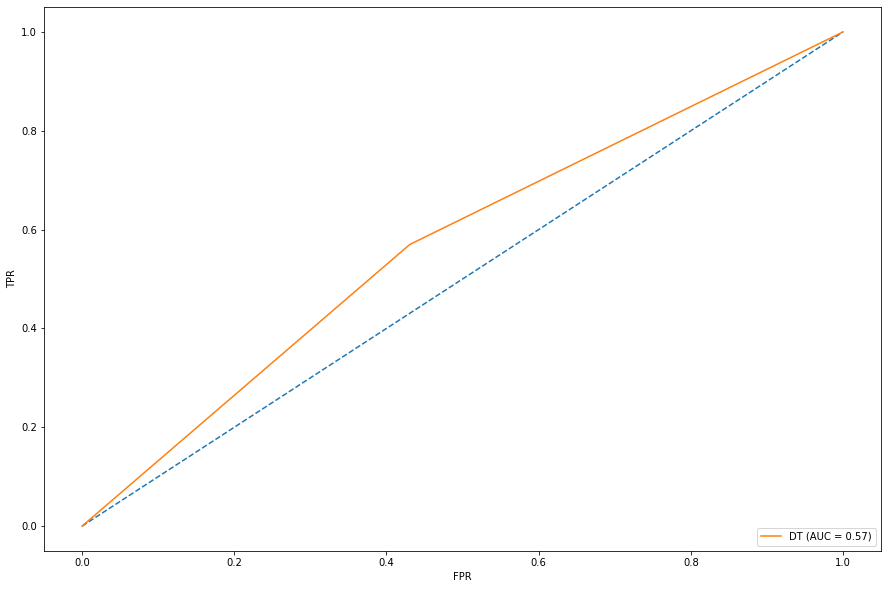

In [ ]:

# calculate scores
auc_dt = roc_auc_score(y_valid, pred_dt)

# calculate roc curves
fpr_dt, tpr_dt, _ = roc_curve(y_valid, pred_dt)

plt.figure(figsize=(15, 10))
# plot horizontal line 
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr_dt, tpr_dt, label='DT (AUC = %0.2f)' % auc_dt)

# axis labels
plt.xlabel('FPR')
plt.ylabel('TPR')
# show the legend
plt.legend(loc='lower right')
# show the plot
plt.show()


In [ ]:
#Working on Model performance


# Scaling all the variables to a range of 0 to 1
from sklearn.preprocessing import MinMaxScaler
features = X.columns.values
scaler = MinMaxScaler(feature_range = (0,1))
scaler.fit(X)
X = pd.DataFrame(scaler.transform(X))
X.columns = features

In [ ]:
X.head(5)

,loan_amnt,term,int_rate,installment,emp_length,dti,earliest_cr_line,open_acc,pub_rec,revol_util,total_acc,mort_acc,pub_rec_bankruptcies,log_annual_inc,fico_score,log_revol_bal,sub_grade_A2,sub_grade_A3,sub_grade_A4,sub_grade_A5,sub_grade_B1,sub_grade_B2,sub_grade_B3,sub_grade_B4,sub_grade_B5,sub_grade_C1,sub_grade_C2,sub_grade_C3,sub_grade_C4,sub_grade_C5,sub_grade_D1,sub_grade_D2,sub_grade_D3,sub_grade_D4,sub_grade_D5,sub_grade_E1,sub_grade_E2,sub_grade_E3,sub_grade_E4,sub_grade_E5,...,addr_state_HI,addr_state_ID,addr_state_IL,addr_state_IN,addr_state_KS,addr_state_KY,addr_state_LA,addr_state_MA,addr_state_MD,addr_state_ME,addr_state_MI,addr_state_MN,addr_state_MO,addr_state_MS,addr_state_MT,addr_state_NC,addr_state_ND,addr_state_NE,addr_state_NH,addr_state_NJ,addr_state_NM,addr_state_NV,addr_state_NY,addr_state_OH,addr_state_OK,addr_state_OR,addr_state_PA,addr_state_RI,addr_state_SC,addr_state_SD,addr_state_TN,addr_state_TX,addr_state_UT,addr_state_VA,addr_state_VT,addr_state_WA,addr_state_WI,addr_state_WY,initial_list_status_w,application_type_Joint App
0,0.652564,1.0,0.532528,0.421841,0.300000,0.001752,0.903226,0.079365,0.000000,0.020014,0.129032,0.000000,0.0,0.740969,0.080863,0.397887,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.282051,0.0,0.238411,0.234921,0.400000,0.011491,0.919355,0.158730,0.000000,0.423159,0.172043,0.000000,0.0,0.761052,0.107817,0.707237,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.000000,0.0,0.415660,0.003242,0.300000,0.010771,0.774194,0.190476,0.000000,0.709078,0.268817,0.000000,0.0,0.764884,0.188679,0.733048,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.230769,0.0,0.220880,0.191165,0.596897,0.020450,0.870968,0.142857,0.000000,0.314510,0.322581,0.086957,0.0,0.710512,0.107817,0.659323,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.089744,0.0,0.814959,0.097615,0.500000,0.023784,0.983871,0.095238,0.071429,0.422445,0.053763,0.000000,0.0,0.691223,0.000000,0.584355,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.25)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size = 0.25)


In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt_model = DecisionTreeClassifier()

print(dt_model)

dt_model = dt_model.fit(X_train,y_train)
pred_dt = dt_model.predict_proba(X_valid)[:, 1]

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')


In [ ]:
from sklearn.metrics import classification_report
pred_dt_binary = dt_model.predict(X_valid)
print(classification_report(y_valid, pred_dt_binary))


              precision    recall  f1-score   support

           0       0.57      0.56      0.56      1887
           1       0.56      0.56      0.56      1863

    accuracy                           0.56      3750
   macro avg       0.56      0.56      0.56      3750
weighted avg       0.56      0.56      0.56      3750



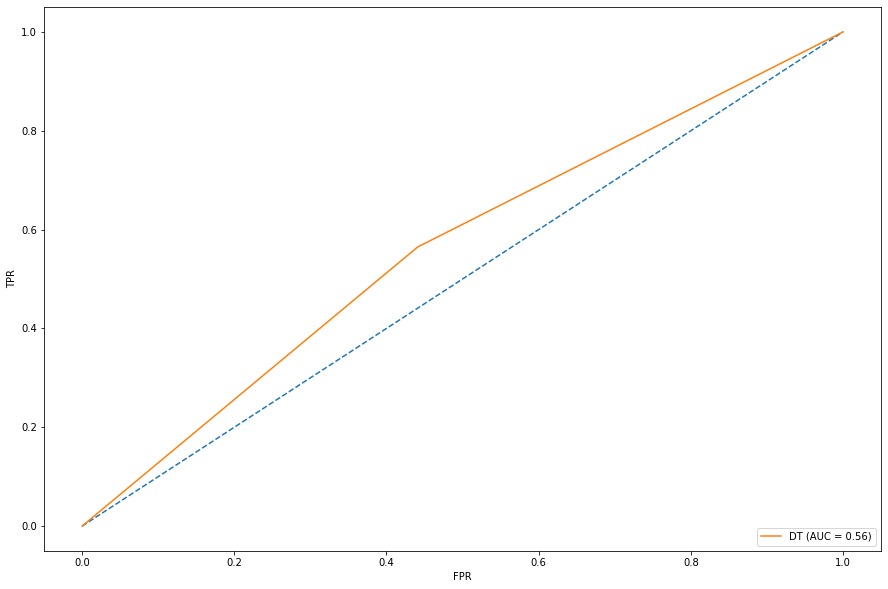

In [ ]:
# calculate scores
auc_dt = roc_auc_score(y_valid, pred_dt)

# calculate roc curves
fpr_dt, tpr_dt, _ = roc_curve(y_valid, pred_dt)

plt.figure(figsize=(15, 10))
# plot horizontal line 
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr_dt, tpr_dt, label='DT (AUC = %0.2f)' % auc_dt)

# axis labels
plt.xlabel('FPR')
plt.ylabel('TPR')
# show the legend
plt.legend(loc='lower right')
# show the plot
plt.show()


In [ ]:
#Applying random forest model


#from sklearn.ensemble import RandomForestRegressor

#rf_model = RandomForestRegressor()  

#print(rf_model)

#rf_model.fit(X_train, y_train)  
#pred_rf = rf_model.predict(X_test) 



from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

In [ ]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))



Accuracy: 0.6344


In [ ]:
from sklearn.metrics import classification_report
pred_dt_binary = clf.predict(X_valid)
print(classification_report(y_valid, pred_dt_binary))

              precision    recall  f1-score   support

           0       0.63      0.67      0.65      1887
           1       0.64      0.61      0.63      1863

    accuracy                           0.64      3750
   macro avg       0.64      0.64      0.64      3750
weighted avg       0.64      0.64      0.64      3750



In [ ]:
# To get the weights of all the variables
import pandas as pd
feature_imp = pd.Series(clf.feature_importances_,index=X.columns).sort_values(ascending=False)
feature_imp.head(10)

int_rate            0.073941
dti                 0.062393
log_revol_bal       0.061303
revol_util          0.059914
installment         0.059720
log_annual_inc      0.056996
loan_amnt           0.053730
fico_score          0.051016
total_acc           0.049255
earliest_cr_line    0.047601
dtype: float64

In [ ]:
#Applying random forest with limited 10 features as shown above

X_new = X[['int_rate','dti','log_revol_bal','revol_util','installment','log_annual_inc','loan_amnt','fico_score','total_acc','earliest_cr_line']]


In [ ]:
X_new.head(2)

,int_rate,dti,log_revol_bal,revol_util,installment,log_annual_inc,loan_amnt,fico_score,total_acc,earliest_cr_line
0,0.532528,0.001752,0.397887,0.020014,0.421841,0.740969,0.652564,0.080863,0.129032,0.903226
1,0.238411,0.011491,0.707237,0.423159,0.234921,0.761052,0.282051,0.107817,0.172043,0.919355


Other part of code which is used only for reference


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_new, Y, test_size = 0.25)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size = 0.25)


In [ ]:
#Applying random forest model

from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

In [ ]:
#checking accuracy:

#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))



Accuracy: 0.6352


In [ ]:
from sklearn.metrics import classification_report
pred_dt_binary = clf.predict(X_valid)
print(classification_report(y_valid, pred_dt_binary))

              precision    recall  f1-score   support

           0       0.61      0.63      0.62      1870
           1       0.62      0.61      0.61      1880

    accuracy                           0.62      3750
   macro avg       0.62      0.62      0.62      3750
weighted avg       0.62      0.62      0.62      3750



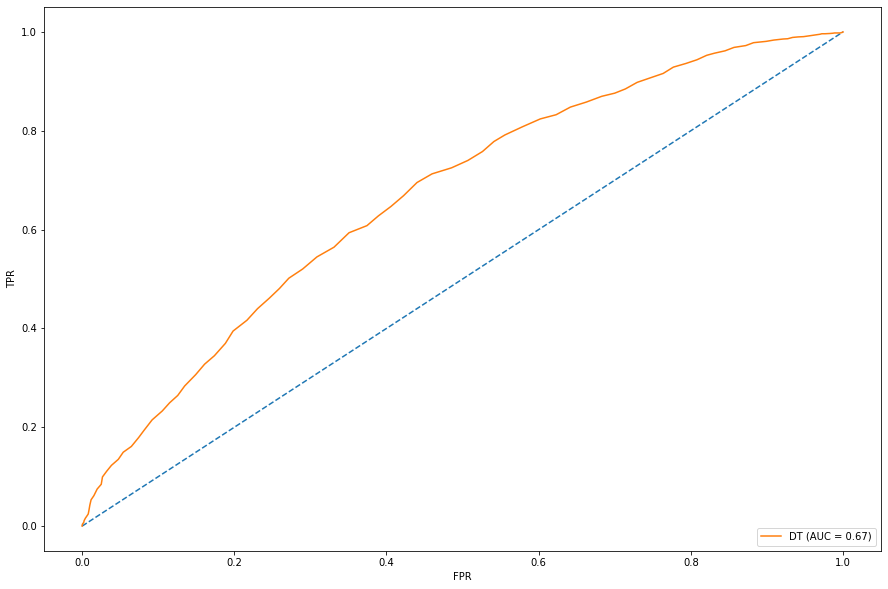

In [ ]:
pred_dt = clf.predict_proba(X_valid)[:, 1]
# calculate scores
auc_dt = roc_auc_score(y_valid, pred_dt)

# calculate roc curves
fpr_dt, tpr_dt, _ = roc_curve(y_valid, pred_dt)

plt.figure(figsize=(15, 10))
# plot horizontal line 
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr_dt, tpr_dt, label='DT (AUC = %0.2f)' % auc_dt)

# axis labels
plt.xlabel('FPR')
plt.ylabel('TPR')
# show the legend
plt.legend(loc='lower right')
# show the plot
plt.show()

In [ ]:
#Applying XG Boost

from xgboost import XGBClassifier
model = XGBClassifier()

In [ ]:
# fit the model with the training data
model.fit(X_train,y_train)
#clf.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
y_pred=model.predict(X_test)

In [ ]:
#Import scikit-learn metrics module for accuracy calculation
from sklearn import metrics
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.6474


In [ ]:
from sklearn.metrics import classification_report
pred_dt_binary = model.predict(X_valid)
print(classification_report(y_valid, pred_dt_binary))

              precision    recall  f1-score   support

           0       0.64      0.64      0.64      1870
           1       0.64      0.65      0.65      1880

    accuracy                           0.64      3750
   macro avg       0.64      0.64      0.64      3750
weighted avg       0.64      0.64      0.64      3750



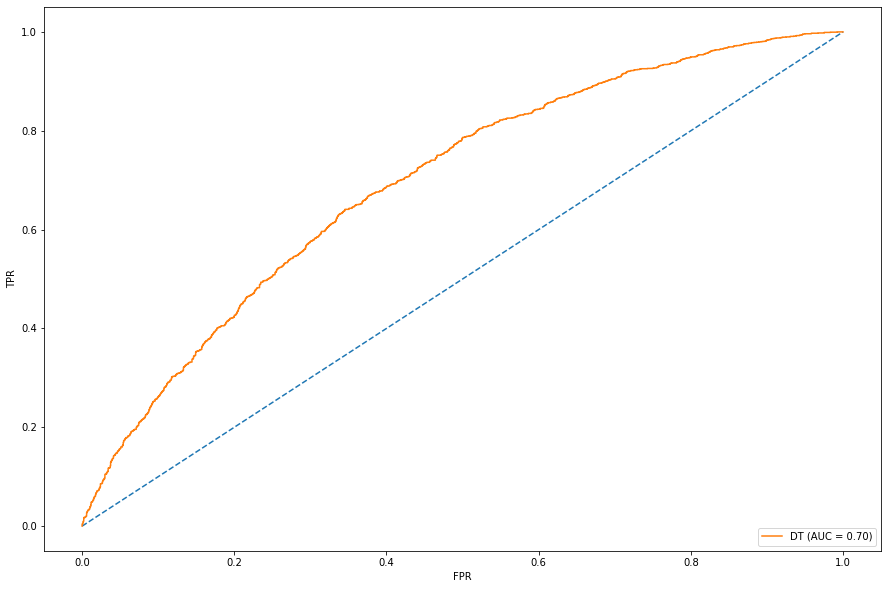

In [ ]:
pred_dt = model.predict_proba(X_valid)[:, 1]
# calculate scores
auc_dt = roc_auc_score(y_valid, pred_dt)

# calculate roc curves
fpr_dt, tpr_dt, _ = roc_curve(y_valid, pred_dt)

plt.figure(figsize=(15, 10))
# plot horizontal line 
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr_dt, tpr_dt, label='DT (AUC = %0.2f)' % auc_dt)

# axis labels
plt.xlabel('FPR')
plt.ylabel('TPR')
# show the legend
plt.legend(loc='lower right')
# show the plot
plt.show()

In [ ]:
#applying all features to X AND FEEDING XG boost again

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.25)
X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size = 0.25)


In [ ]:
model.fit(X_train,y_train)
#clf.fit(X_train,y_train)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [ ]:
y_pred=model.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report
pred_dt_binary = model.predict(X_valid)
print(classification_report(y_valid, pred_dt_binary))

              precision    recall  f1-score   support

           0       0.67      0.66      0.66      1910
           1       0.65      0.66      0.66      1840

    accuracy                           0.66      3750
   macro avg       0.66      0.66      0.66      3750
weighted avg       0.66      0.66      0.66      3750



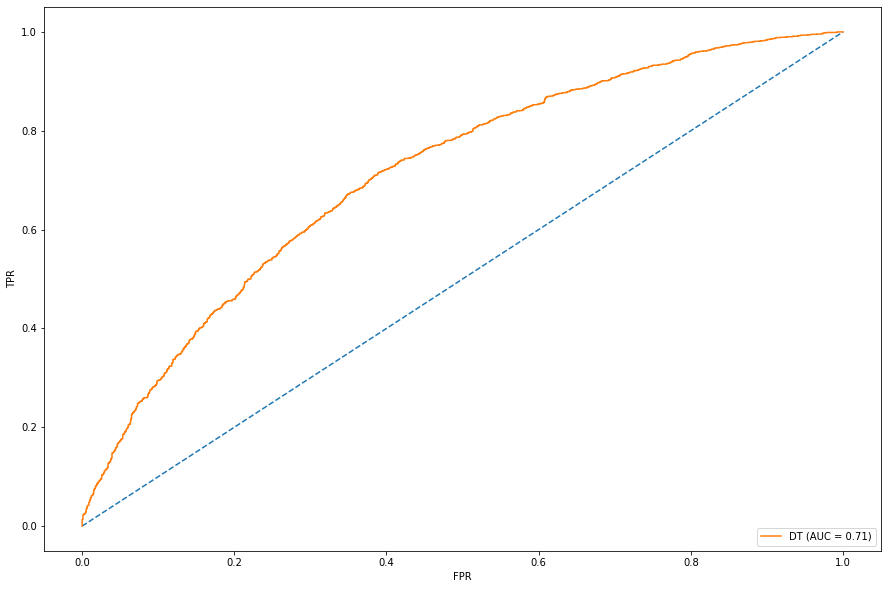

In [ ]:
pred_dt = model.predict_proba(X_valid)[:, 1]
# calculate scores
auc_dt = roc_auc_score(y_valid, pred_dt)

# calculate roc curves
fpr_dt, tpr_dt, _ = roc_curve(y_valid, pred_dt)

plt.figure(figsize=(15, 10))
# plot horizontal line 
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr_dt, tpr_dt, label='DT (AUC = %0.2f)' % auc_dt)

# axis labels
plt.xlabel('FPR')
plt.ylabel('TPR')
# show the legend
plt.legend(loc='lower right')
# show the plot
plt.show()

In [ ]:
# To get the weights of all the variables
import pandas as pd
feature_imp = pd.Series(model.feature_importances_,index=X.columns).sort_values(ascending=False)
feature_imp.head(10)

int_rate                        0.181062
term                            0.072515
fico_score                      0.031237
pub_rec                         0.029967
mort_acc                        0.026283
loan_amnt                       0.025578
installment                     0.023935
verification_status_Verified    0.023704
addr_state_FL                   0.022543
home_ownership_RENT             0.020724
dtype: float32

In [ ]:
# Create a new dataframe that includes valuable columns for prediction

#ID : "A unique [LendingClub] assigned ID for the loan listing."
#loan_amnt: The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value."
#term: The number of payments on the loan. Values are in months and can be either 36 or 60."
#int_rate: Interest Rate on the loan.
#installment: The monthly payment owed by the borrower if the loan originates.
#grade, sub_grade: LendingClub assigned loan grade."   LendingClub assigned loan subgrade.
#emp_title:he job title supplied by the Borrower when applying for the loan.
#emp_length: Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years." The actual data does not match this description:
#home_ownership: The home ownership status provided by the borrower during registration or obtained from the credit report. Our values are: RENT, OWN, MORTGAGE, OTHER."
#annual_inc: The self-reported annual income provided by the borrower during registration."
#verification_status: Indicates if income was verified by [Lending Club], not verified, or if the income source was verified."
#issue_d: "The month which the loan was funded."
#purpose: A category provided by the borrower for the loan request."
#title: The loan title provided by the borrower."
#zip_code, addr_state: he first 3 numbers of the zip code provided by the borrower in the loan application."
#addr_state: "The state provided by the borrower in the loan application."
#dti: A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income."
#earliest_cr_line: The month the borrower's earliest reported credit line was opened."
#fico_range_low, fico_range_high: The lower boundary range the borrower’s FICO at loan origination belongs to."The upper boundary range the borrower’s FICO at loan origination belongs to."
#open_acc: The number of open credit lines in the borrower's credit file."
#pub_rec: Number of derogatory public records."
#revol_bal: Total credit revolving balance.
#revol_util: Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit."
#total_acc: The total number of credit lines currently in the borrower's credit file."
#initial_list_status: The initial listing status of the loan. Possible values are – W, F." I'm not sure what this means.
#application_type: Indicates whether the loan is an individual application or a joint application with two co-borrowers."
#mort_acc: "Number of mortgage accounts."
#pub_rec_bankruptcies: "Number of public record bankruptcies."
#
'''
lc_data_new_final = lc_data_new.filter(['loan_amnt',
                                        'total_rec_prncp',
                                        'recoveries',
                                        'collection_recovery_fee',
                                        'last_pymnt_amnt',
                                        'last_fico_range_high',
                                        'last_fico_range_low',
                                        'term',
                                        'grade',
                                        'sub_grade',
                                        'int_rate',
                                        'emp_title',
                                        'annual_inc',
                                        'installment',
                                        'open_acc',
                                        'pub_rec',
                                        'issue_d',
                                        'earliest_cr_line',
                                        'revol_bal',
                                        'total_acc',





'emp_length',
'home_ownership',
'issue_d',
'verification_status',
'purpose',
'title',
'zip_code',
'addr_state',
'dti'
]
)
lc_data_new_final.dtypes
'''




In [ ]:
#another function to find missing values

'''
def missing_zero_values_table(df):
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        mz_table = mz_table.rename(
        columns = {0 : 'Zero Values', 1 : 'Missing Values', 2 : '% of Total Values'})
        mz_table['Total Zero Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table['% Total Zero Missing Values'] = 100 * mz_table['Total Zero Missing Values'] / len(df)
        mz_table['Data Type'] = df.dtypes
        mz_table = mz_table[
            mz_table.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns and " + str(df.shape[0]) + " Rows.\n"      
            "There are " + str(mz_table.shape[0]) +
              " columns that have missing values.")
#         mz_table.to_excel('D:/sampledata/missing_and_zero_values.xlsx', freeze_panes=(1,0), index = False)
        return mz_table

missing_zero_values_table(lc_data)

'''